# Project Overview
The aim of this project is to evaluate the effectiveness of a pre-trained object detection model and its performance after fine-tuning on a specific dataset. The focus is on detecting pedestrians, bicycles, and vehicles in traffic situation videos.

**Model Selection**: We chose the <a href="https://github.com/ultralytics/yolov3">Ultralytics YOLOv3</a> model for its balance between detection speed and accuracy. The model's extensive functionalities for training and testing, facilitated by its Python package, make it suitable for our requirements.

**Dataset**: The <a href="https://waymo.com/open/">Waymo Open Dataset</a> was selected for its comprehensive coverage of various traffic scenarios. It provides a rich set of annotations necessary for training and evaluating object detection models.

**Methodology**

1. **Data Preprocessing**: Extract relevant frames from the Waymo Open Dataset and create corresponding annotations for pedestrians, bikes, and cars
2. **Pre-trained Model Evaluation**: Run the pre-trained YOLOv3 model on the dataset, measuring performance metrics such as mean Average Precision (mAP).
3. **Model Fine-tuning**: Fine-tune the YOLOv3 model using the prepared dataset.
4. **Fine-tuned Model Evaluation**: Evaluate the fine-tuned model on the dataset, again measuring performance with mAP.

# Setup

I order to run this notebook, the following packages need to be installed in your environment and imported

In [ ]:
# Install required packages
%pip install -q ultralytics pandas pillow tqdm numpy matplotlib opencv-python pyarrow ipython

In [8]:
# Import required libraries
from ultralytics import YOLO
from ultralytics.data.utils import compress_one_image

import pandas as pd
import os
import io
from PIL import Image
from glob import glob
from tqdm import tqdm
import cv2

import math
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from IPython.display import Video
from IPython.display import Image as iPyImage

Furthermore, the Waymo Open Dataset v2 needs to be downloaded and at least the `camera_image`and `camera_box`subfolders for each training, validation and testing need to be present. Once you obtained the dataset, point `DATASET_DIR` to it and set the device you want your model to run on.

In [6]:
# Global constants
DEVICE = 'cuda'
DATASET_DIR = '~/Downloads/waymo'

You can skip the data preprocessing and model training and use our predefined dataset and model weights.

**Skip data preprocessing**
1. You can download our pre-processed dataset <a href="https://drive.google.com/file/d/1HYsySh6_Du4SKNboLQg58s8l3cEu4vFR/view?usp=share_link">here</a>. Extract the zip file to the same directory as this notebook.
2. You need to change the path within the `waymo.yaml` file to the <u>absolute path</u> where the dataset path resides.

    Example: `waymo_dataset_processed` is located in `~/Downloads/waymo_dataset_processed` (where `waymo_dataset_processed` contains the folders `images`, `labels` and `waymo.yaml`)
    Then: Point waymo.yaml `path:` to `/home/user/Downloads/waymo_dataset_processed`

**Skip model training**
1. You can download our model weights trained on 100 epochs <a href="https://drive.google.com/file/d/1TlAY5bipAZZ2qWLq3o6NwyW7JPwd1R_H/view?usp=share_link">here</a>. Make sure to point to it in `BEST_MODEL_WEIGHTS` (file path)

In [3]:
BEST_MODEL_WEIGHTS = None

## Dataset Analysis

This section contains a quantitative and qualitative description of the relevant subset of the <a href="https://waymo.com/open/">Waymo Open Dataset</a> used in this project. The Waymo Open Dataset uses the Apache Parquet column-oriented format for data storage.

The perception dataset includes 2D bounding box labels for camera images: _"The camera labels are tight-fitting, axis-aligned 2D bounding boxes with globally unique tracking IDs. The bounding boxes cover only the visible parts of the objects."_ (<a href="https://waymo.com/open/data/perception/#2d-bounding-boxes">more details</a>)

The dataset includes labels for the following objects:
- vehicles (<code>[CameraBoxComponent].type == 1</code>)
- pedestrians (<code>[CameraBoxComponent].type == 2</code>)
- cyclists (<code>[CameraBoxComponent].type == 4</code>)

For details see <a href="https://github.com/waymo-research/waymo-open-dataset/blob/master/docs/labeling_specifications.md">Waymo Open Dataset Labeling Specifications</a>

The dataset contains images from 5 different cameras. We will be using only the images from the front facing camera (<code>key.camera_name == 1</code>) in this project.



### Training-Validation-Test Split

The dataset is split into folders:
- <code>training/</code>
- <code>validation/</code>
- <code>testing/</code>

with each containing following subfolders
- <code>camera_image/</code>
- <code>camera_box/</code>

where the first one contains the image data and the second one the box label definitions in the form of multiple <code>.parquet</code> files. Each of those files contains a sequence of consecutive camera frames from the different cameras.

### Loading Datasets

In [ ]:
# Path to the Waymo dataset
TRAINING_DIR = os.path.join(DATASET_DIR, 'training')
VALIDATION_DIR = os.path.join(DATASET_DIR, 'validation')
TESTING_DIR = os.path.join(DATASET_DIR, 'test')

#### Training

In [ ]:
# iterate through all parquet files in camera_image folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(TRAINING_DIR, 'camera_image', '*.parquet'))
for sample_file_path in sample_file_paths:
    df = pd.read_parquet(sample_file_path)
    # analyze metadata only (remove image data to save memory)
    df = df.loc[:, ['key.segment_context_name', 'key.frame_timestamp_micros', 'key.camera_name']]
    df_array.append(df)
df_training_img = pd.concat(df_array)

In [ ]:
# iterate through all parquet files in camera_box folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(TRAINING_DIR, 'camera_box', '*.parquet'))
for sample_file_path in sample_file_paths:
    df_array.append(pd.read_parquet(sample_file_path))
df_training_box = pd.concat(df_array)

#### Validation

In [ ]:
# iterate through all parquet files in camera_image folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(VALIDATION_DIR, 'camera_image', '*.parquet'))
for sample_file_path in sample_file_paths:
    df = pd.read_parquet(sample_file_path)
    # analyze metadata only (remove image data to save memory)
    df = df.loc[:, ['key.segment_context_name', 'key.frame_timestamp_micros', 'key.camera_name']]
    df_array.append(df)
df_validation_img = pd.concat(df_array)

In [ ]:
# iterate through all parquet files in camera_box folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(VALIDATION_DIR, 'camera_box', '*.parquet'))
for sample_file_path in sample_file_paths:
    df_array.append(pd.read_parquet(sample_file_path))
df_validation_box = pd.concat(df_array)

#### Testing

In [ ]:
# iterate through all parquet files in camera_image folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(TESTING_DIR, 'camera_image', '*.parquet'))
for sample_file_path in sample_file_paths:
    df = pd.read_parquet(sample_file_path)
    # analyze metadata only (remove image data to save memory)
    df = df.loc[:, ['key.segment_context_name', 'key.frame_timestamp_micros', 'key.camera_name']]
    df_array.append(df)
df_testing_img = pd.concat(df_array)

In [ ]:
# iterate through all parquet files in camera_box folder and load data into DataFrame
df_array = []
sample_file_paths = glob(os.path.join(TESTING_DIR, 'camera_box', '*.parquet'))
for sample_file_path in sample_file_paths:
    df_array.append(pd.read_parquet(sample_file_path))
df_testing_box = pd.concat(df_array)

### Sample Frame with 2D Bounding Boxes

In [ ]:
# Load parquet file with image data into DataFrame
sample_file_path = glob(os.path.join(TRAINING_DIR, 'camera_image', '*.parquet'))[0]
df = pd.read_parquet(sample_file_path)

# Take first image from front-facing camera
binary_image = df[df['key.camera_name'] == 1]['[CameraImageComponent].image'].iloc[0]
segment = df[df['key.camera_name'] == 1]['key.segment_context_name'].iloc[0]
timestamp = df[df['key.camera_name'] == 1]['key.frame_timestamp_micros'].iloc[0]

image_data = io.BytesIO(binary_image)
image = Image.open(image_data)

# Load parquet file with 2D bounding box data into DataFrame
sample_file_path = glob(os.path.join(TRAINING_DIR, 'camera_box', '*.parquet'))[0]
df = pd.read_parquet(sample_file_path)

# find same frame in label data
boxes = df[(df['key.camera_name'] == 1) & (df['key.segment_context_name'] == segment) & (df['key.frame_timestamp_micros'] == timestamp)]
# only vehicles in sample frame
boxes_vehicles = boxes[boxes['[CameraBoxComponent].type'] == 1]
#boxes_vehicles.shape
#boxes_vehicles

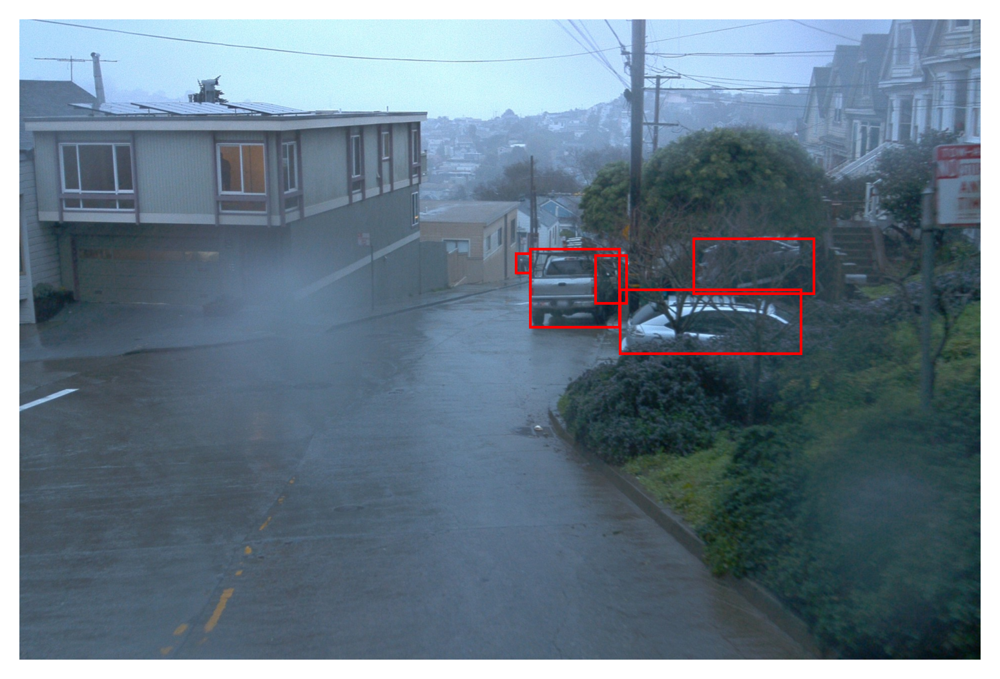

In [ ]:
# plot sample frame including 2D bounding boxes
fig, ax = plt.subplots(dpi=300)

# color coding per label class
colors = ['red','blue','green'] # rehicles (red), pedestrians (blue), cyclists (green)

# draw the 2D bounding boxes
for i in range(boxes.shape[0]):
    ax.add_patch(patches.Rectangle(xy=(boxes['[CameraBoxComponent].box.center.x'].iloc[i] - 0.5 * boxes['[CameraBoxComponent].box.size.x'].iloc[i], 
                                       boxes['[CameraBoxComponent].box.center.y'].iloc[i] - 0.5 * boxes['[CameraBoxComponent].box.size.y'].iloc[i]),
                                   width=boxes['[CameraBoxComponent].box.size.x'].iloc[i],
                                   height=boxes['[CameraBoxComponent].box.size.y'].iloc[i],
                                   linewidth=1,
                                   edgecolor=colors[math.floor((boxes['[CameraBoxComponent].type'].iloc[i])/2)], # index mapping: 1->0, 2->1, 4->2
                                   facecolor='none'))

# show the camera image
plt.imshow(image)
plt.grid(False)
plt.axis('off')

plt.show()

### Statistics

#### Number of labeled frames per dataset

2D bounding box labels are provided for the training and validation datasets, but not for the testing dataset.

In [ ]:
# group label data by segment and timestamp to count number of frames
frames_training = df_training_box[df_training_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros"], as_index=False).size().shape[0]
frames_validation = df_validation_box[df_validation_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros"], as_index=False).size().shape[0]
#frames_testing = df_testing_box[df_testing_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros"], as_index=False).size().shape[0]

# count number of rows for front facing camera
frames_testing = df_testing_img[df_testing_img["key.camera_name"] == 1].shape[0]

frames_counts = [frames_training, frames_validation, frames_testing]

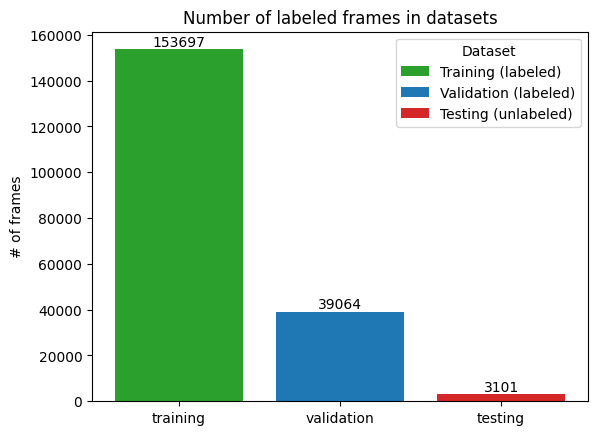

In [ ]:
# plot number of frames in each dataset
fig, ax = plt.subplots()

datasets = ['training', 'validation', 'testing']
bar_labels = ['Training (labeled)', 'Validation (labeled)', 'Testing (unlabeled)']
bar_colors = ['tab:green', 'tab:blue', 'tab:red']

rects = ax.bar(datasets, frames_counts, label=bar_labels, color=bar_colors)
ax.bar_label(rects, fmt='%d')

ax.set_ylabel('# of frames')
ax.set_title('Number of labeled frames in datasets')
ax.legend(title='Dataset')

plt.show()

In [ ]:
np.array(frames_counts) / sum(frames_counts)

array([    0.78472,     0.19945,    0.015833])

The dataset is split into approximately 78.5% of frames for training, 20% for validation and 1.5% for testing. 

#### Number of frames in each sequence (i.e. parquet file)

Each <code>.parquet</code> file includes a sequence of approximately 200 labeled frames (per camera). See the code below for obtaining the number of frames per segment.

In [ ]:
# number of frames per segment (based on \camera_box data --> assuming each frame has at least one label)
df_training_box[df_training_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros"], as_index=False).size().groupby(["key.segment_context_name"]).size()
#df_training[df_training["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros"], as_index=False).size().groupby(["key.segment_context_name"]).size().value_counts()

key.segment_context_name
10017090168044687777_6380_000_6400_000    198
10023947602400723454_1120_000_1140_000    199
1005081002024129653_5313_150_5333_150     199
10061305430875486848_1080_000_1100_000    198
10072140764565668044_4060_000_4080_000    198
                                         ... 
9758342966297863572_875_230_895_230       199
9820553434532681355_2820_000_2840_000     198
9907794657177651763_1126_570_1146_570     199
990914685337955114_980_000_1000_000       198
9985243312780923024_3049_720_3069_720     199
Length: 798, dtype: int64

In [ ]:
# number of frames per segment (based on \camera_image data)
df_testing_img[df_testing_img["key.camera_name"] == 1].groupby(["key.segment_context_name"], as_index=False).size()

,key.segment_context_name,size
0,10504764403039842352_460_000_480_000,166
1,10980133015080705026_780_000_800_000,198
2,11987368976578218644_1340_000_1360_000,198
3,14188689528137485670_2660_000_2680_000,198
4,14737335824319407706_1980_000_2000_000,199
5,15272375112495403395_620_000_640_000,196
6,17136775999940024630_4860_000_4880_000,188
7,17792628511034220885_2360_000_2380_000,172
8,18149616047892103767_2460_000_2480_000,198
9,2601205676330128831_4880_000_4900_000,199


#### Total counts of occurances of each label

Below we analyze the overall distribution of labels in the training dataset:

In [ ]:
# count occurances of labels (total number over dataset) for training dataset
type_counts_training = df_training_box[df_training_box["key.camera_name"] == 1]['[CameraBoxComponent].type'].value_counts()
type_counts_training

[CameraBoxComponent].type
1    2864209
2     750593
4      30065
Name: count, dtype: int64

In [ ]:
# count occurances of labels (total number over dataset) for validation dataset
type_counts_validation = df_validation_box[df_validation_box["key.camera_name"] == 1]['[CameraBoxComponent].type'].value_counts()
type_counts_validation

[CameraBoxComponent].type
1    711538
2    167556
4      6821
Name: count, dtype: int64

In [ ]:
# calculate percentage of each label type for training and validation datasets
type_counts_training = type_counts_training.to_numpy()
type_counts_training_rel = type_counts_training / sum(type_counts_training)
print(type_counts_training_rel)
type_counts_validation = type_counts_validation.to_numpy()
type_counts_validation_rel = type_counts_validation / sum(type_counts_validation)
print(type_counts_validation_rel)

[    0.78582     0.20593   0.0082486]
[    0.80317     0.18913   0.0076994]


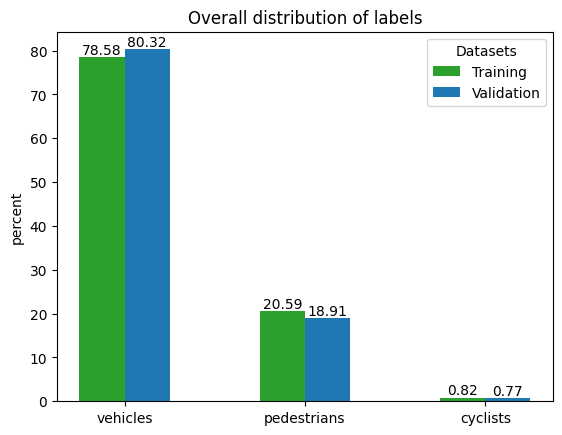

In [ ]:
# plot distribution of labels per dataset
fig, ax = plt.subplots()

classes = ['vehicles', 'pedestrians', 'cyclists']
bar_colors = ['tab:green', 'tab:blue', 'tab:red']
percentages = {
    'Training': type_counts_training_rel*100,
    'Validation': type_counts_validation_rel*100
}

x = np.arange(len(classes))  # label locations
width = 0.25  # width of the bars
multiplier = 0

for attribute, values in percentages.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, values, width, label=attribute, color=bar_colors[multiplier])
    ax.bar_label(rects, fmt='%.2f')
    multiplier += 1

ax.set_xticks(x + width/2, classes)
ax.set_ylabel('percent')
ax.set_title('Overall distribution of labels')
ax.legend(title='Datasets')

plt.show()

Labels are predominantly for vehicles (ca. 80%), with a smaller fraction for pedestrians (ca. 20%) and only few cyclists (ca. 1%).

#### Number of frames per label

Below we analyze the number of frames which contain at least one label per class (vehicle, pedestrian, cyclist):

In [ ]:
# how many frames with car (1), person (2), bicycle (4) where camera = 1 (front facing) in training dataset
frame_counts_training = df_training_box[df_training_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros", "[CameraBoxComponent].type"], as_index=False).size()['[CameraBoxComponent].type'].value_counts()
frame_counts_training

[CameraBoxComponent].type
1    152726
2     83832
4     20221
Name: count, dtype: int64

In [ ]:
# how many frames with car (1), person (2), bicycle (4) where camera = 1 (front facing) in validation dataset
frame_counts_validation = df_validation_box[df_validation_box["key.camera_name"] == 1].groupby(["key.segment_context_name", "key.frame_timestamp_micros", "[CameraBoxComponent].type"], as_index=False).size()['[CameraBoxComponent].type'].value_counts()
frame_counts_validation

[CameraBoxComponent].type
1    38551
2    21189
4     4617
Name: count, dtype: int64

In [ ]:
# convert to numpy arrays
frame_counts_training = frame_counts_training.to_numpy()
print(frame_counts_training)

frame_counts_validation = frame_counts_validation.to_numpy()
print(frame_counts_validation)

[152726  83832  20221]
[38551 21189  4617]


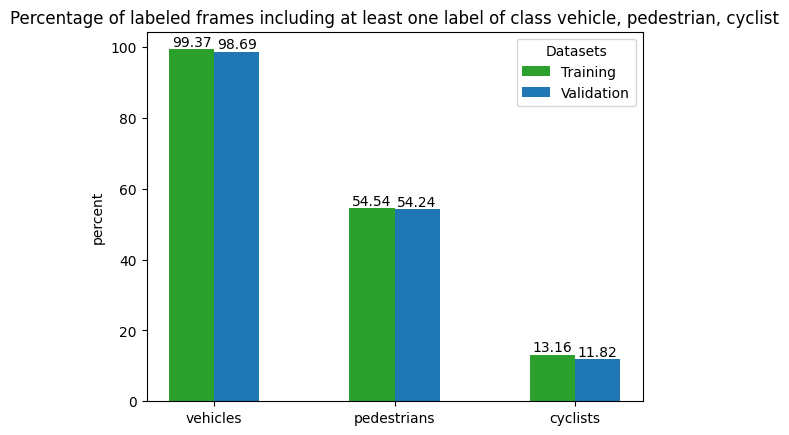

In [ ]:
# plot distribution of frames with different lables per dataset
fig, ax = plt.subplots()

classes = ['vehicles', 'pedestrians', 'cyclists']
bar_colors = ['tab:green', 'tab:blue', 'tab:red']
counts = {
    'Training': frame_counts_training,
    'Validation': frame_counts_validation
}

x = np.arange(len(classes))  # label locations
width = 0.25  # width of the bars
multiplier = 0

for attribute, values in counts.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, values / frames_counts[multiplier] * 100, width, label=attribute, color=bar_colors[multiplier])
    ax.bar_label(rects, fmt='%.2f')
    multiplier += 1

ax.set_xticks(x + width/2, classes)
ax.set_ylabel('percent')
ax.set_title('Percentage of labeled frames including at least one label of class vehicle, pedestrian, cyclist')
ax.legend(title='Datasets')

plt.show()

Almot all labeled frames contain vehicles (ca. 99%), with approximately half of the labeled frames including pedestrians (ca. 50%) and ca. 12% including cyclists.

## Data preparation

For this project, we will only consider a subset of the whole dataset. We are going to be using 200 of 799 parquet files in the training set. The goal is to convert the data format of the Waymo Open Dataset into the format ultralytics YOLO datasets are expected to look like. This includes a separation of the annotation and image files as well as a dataset describing metadata file.

In [ ]:
# First, we fetch all parquet files for images and annotations
images_paths = [os.path.join(DATASET_DIR, 'training', 'camera_image', file) 
                for file in os.listdir(os.path.join(DATASET_DIR, 'training', 'camera_image')) 
                if file.endswith('.parquet')][:200] # first 200 files

annotation_paths = [os.path.join(DATASET_DIR, 'training', 'camera_box', file) 
                    for file in os.listdir(os.path.join(DATASET_DIR, 'training', 'camera_box')) 
                    if file.endswith('.parquet')][:200] # first 200 files

Each parquet file in the dataset contains one specific driving scene. Therefore, a file-based data split will be used. This ensures that a driving scene is only present in one split, preventing data leakage that could over-estimate the model's performance.

We are going to use 70% as our training data, 20% for the validation during training and 10% to test the generalization abilities of our model.

In [ ]:
# Using around 1/3 of the waymo dataset, we perform a driving scene (=file) based split to avoid data leakage
# Using 70/20/10 split
train_size, val_size, test_size = int(len(images_paths) * 0.7), int(len(images_paths) * 0.2), int(len(images_paths) * 0.1)

images_paths_train, annotation_paths_train = images_paths[:train_size], annotation_paths[:train_size]
images_paths_val, annotation_paths_val = images_paths[train_size:train_size+val_size], annotation_paths[train_size:train_size+val_size]
images_paths_test, annotation_paths_test = images_paths[train_size+val_size:], annotation_paths[train_size+val_size:]

# Check if split contains all files
print(len(images_paths_train) + len(images_paths_val) + len(images_paths_test))

We create a subfolder structure containing the processed images and annotation files according to the <a href="https://docs.ultralytics.com/yolov5/tutorials/train_custom_data/#21-create-datasetyaml">specifications of a YOLO dataset</a>

In [ ]:
# Create the folder structure of a YOLO dataset (https://docs.ultralytics.com/yolov5/tutorials/train_custom_data/#21-create-datasetyaml)
for folder in ['waymo_dataset_processed', 'waymo_dataset_processed/images', 'waymo_dataset_processed/labels',
               'waymo_dataset_processed/images/train', 'waymo_dataset_processed/labels/train', 'waymo_dataset_processed/images/val',
               'waymo_dataset_processed/labels/val', 'waymo_dataset_processed/images/test', 'waymo_dataset_processed/labels/test']:
    os.makedirs(folder, exist_ok=True)

# Write the configuration file describing the dataset
with open('waymo_dataset_processed/waymo.yaml', 'w') as f:
    f.write(
f"""path: {os.path.join(os.getcwd(), 'waymo_dataset_processed')}
train: images/train
val: images/val
test: images/test

names:
  0: person
  1: bicycle
  2: car
"""
    )

# Mapping from Waymo labels to YOLOv3 labels
label_mapping = {1: 2, 2: 0, 4: 1}

The preprocessing manipulates the data in the following ways:

1. Images
    - Keep only the front-facing camera image of each frame to reduce the complexity of the data
    - We decided to not futher augment the data since there is enough data available. The underrepresentation of bikes could be improved by oversampling, but is not feasible because in each image of bicycles there are also cars and pedestrians
    - Since YOLO accepts flexbile image dimensions, we kept the original dimensions of 1920x1080 pixels. When feeding them into the neural network, they get automatically reduces to 640 pixels width.
    - Compress a single image file to reduced size while preserving its aspect ratio and quality using the Python Imaging Library (PIL) (50% quality) to reduce the file sizes

2. Annotations
    - Find all matching boxes for each image
    - Convert the object class to the COCO dataset format on which the YOLO model was trained on
        - vehicles (<code>[CameraBoxComponent].type == 1</code> => <code>COCO_LABEL = 2</code>)
        - pedestrians (<code>[CameraBoxComponent].type == 2</code>  => <code>COCO_LABEL = 0</code>)
        - cyclists (<code>[CameraBoxComponent].type == 4</code>  => <code>COCO_LABEL = 1</code>)
    - Write each bounding box for one image into one annotation file of the same name. Each line in the annotation file has the format:

        `class, x_center, y_center, width, height`

In [ ]:
# Process images and annotation and copy into temporary folder
def process_images(images_paths, annotation_paths, split):
    for img_path, annot_path in tqdm(zip(images_paths, annotation_paths), total=len(images_paths)):
        # Read the images and annotations from parquet into pandas dataframes
        img_df = pd.read_parquet(img_path)
        annot_df = pd.read_parquet(annot_path)

        for index, img_row in img_df.iterrows():
            # Only keep front facing camera images
            camera_id = img_row['key.camera_name']
            if camera_id != 1:
                continue

            # Process the image
            image_bytes = img_row['[CameraImageComponent].image']
            image = Image.open(io.BytesIO(image_bytes))
            image_name = f"{index}_cam{img_row['key.camera_name']}.jpg"
            image_path = os.path.join('waymo_dataset_processed', 'images', split, image_name)
            image.save(image_path)
            compress_one_image(image_path) # Uses ultralytics image compression (needs to be called on file path)

            # Find all annotations from annotation dataframe for this image
            matching_boxes = annot_df[(annot_df['key.segment_context_name'] == img_row['key.segment_context_name']) &
                            (annot_df['key.frame_timestamp_micros'] == img_row['key.frame_timestamp_micros']) &
                            (annot_df['key.camera_name'] == img_row['key.camera_name'])]
            
            # Save annotations in YOLO format
            with open(os.path.join('waymo_dataset_processed', 'labels', split, f"{index}_cam{camera_id}.txt"), 'w') as f:
                for _, box_row in matching_boxes.iterrows():
                    object_class = label_mapping[box_row['[CameraBoxComponent].type']] # Get COCO label from Waymo label
                    x_center = box_row['[CameraBoxComponent].box.center.x']
                    y_center = box_row['[CameraBoxComponent].box.center.y']
                    width = box_row['[CameraBoxComponent].box.size.x']
                    height = box_row['[CameraBoxComponent].box.size.y']
                    f.write(f"{object_class} {x_center / image.size[0]} {y_center / image.size[1]} {width / image.size[0]} {height / image.size[1]}\n")

In [ ]:
# Process files and move to correct folders
process_images(images_paths_train, annotation_paths_train, 'train')
process_images(images_paths_val, annotation_paths_val, 'val')
process_images(images_paths_test, annotation_paths_test, 'test')

# Training

## Reference experiment

For the training, we used the pretrained YOLOv3 by ultralytics, which was trained on the COCO dataset. Due to computational constraints, we used the tiny version, which has less tunable parameters and thus allows for faster training and inference.

The ultralytics YOLO python library offers streamlined APIs for training, evaluating and testing models. It downloads the model weights and uses a PyTorch backend to perform the tasks.

Firstly, we are going to load the pretrained model without any finetuning and assess it's object detection performance on the test set

In [ ]:
model = YOLO('yolov3-tinyu.pt') # Loads the model, in this case YOLOv3-tiny. It will download the model weights

results = model.val(data='waymo_dataset_processed/waymo.yaml', batch=8, device=DEVICE, project=os.path.join(os.getcwd(), 'runs'), plots=True, split='test')

Let's print a sample video of one traffic situation to illustrate the model's performance

In [4]:
def create_video(model_weights):
    # load one sequence into DataFrame
    sample_file_path = glob(os.path.join(DATASET_DIR, 'training', 'camera_image', '13254498462985394788_980_000_1000_000.parquet')) # parquet file with a lot of pedestrians and cars mixed
    df = pd.read_parquet(sample_file_path)
    df = df[df["key.camera_name"] == 1]

    # load model
    model = YOLO(model_weights)

    model_used = os.path.split(model_weights)[1].split('.')[0] # get filename only to save video file
    video_name = f'video_{model_used}.mp4'

    binary_image = df['[CameraImageComponent].image'].iloc[0]
    image_data = io.BytesIO(binary_image)
    image = Image.open(image_data)

    video = cv2.VideoWriter(video_name, cv2.VideoWriter_fourcc(*'avc1'), 10, (image.width, image.height))

    for i in range(df.shape[0]):
        binary_image = df['[CameraImageComponent].image'].iloc[i]
        image_data = io.BytesIO(binary_image)
        image = Image.open(image_data)

        results = model(image, verbose=False, device=DEVICE)
        for result in results:
            im_array = result.plot() # BGR array
            im = Image.fromarray(im_array[..., ::-1]) # RGB image   
            video.write(cv2.cvtColor(np.array(im), cv2.COLOR_RGB2BGR))

    cv2.destroyAllWindows()
    video.release()

In [9]:
create_video('yolov3-tinyu.pt')

Video('video_yolov3-tinyu.mp4')

We observe that the baseline model already performs adequately in the detection task. Besides detecting cars, bicycles and pedestrians, it also detects other objects in the COCO dataset it was pretrained on (e.g. traffic lights). We can observe however, that some distant cars and people crossing the second crosswalk were not detected.

We now evaluate the summary statistics generated during `model.val()`.

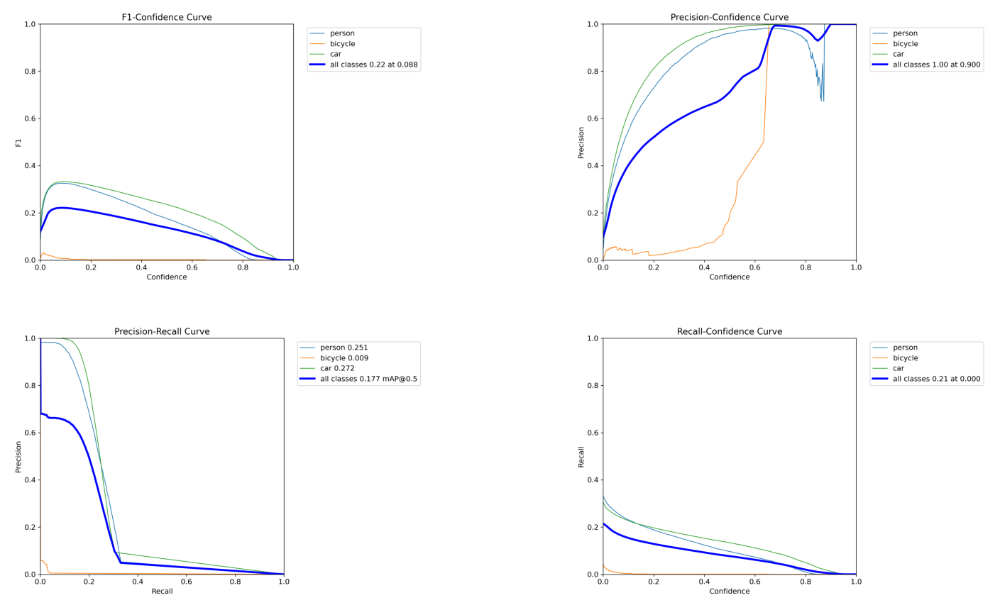

In [10]:
# Load the image files
img1 = plt.imread('runs/test1/F1_curve.png')
img2 = plt.imread('runs/test1/P_curve.png')
img3 = plt.imread('runs/test1/PR_curve.png')
img4 = plt.imread('runs/test1/R_curve.png')

# Create a figure and axes object
fig, axs = plt.subplots(2, 2, figsize=(16, 9))
fig.tight_layout()

# Display the images in the grid
axs[0, 0].imshow(img1)
axs[0, 1].imshow(img2)
axs[1, 0].imshow(img3)
axs[1, 1].imshow(img4)

# Disable image coordinates
axs[0, 0].axis('off')
axs[0, 1].axis('off')
axs[1, 0].axis('off')
axs[1, 1].axis('off')

# Show the plot
plt.show()


The F1-Confidence curve for the 'car' class is generally above the other two ('person' and 'bicycle'), suggesting better performance. There is a peak performance at a lower confidence threshold, suggesting the model might be more conservative in its predictions.

The precision for 'car' in the Precision-Confidence curve remains high as confidence increases, which is desirable. However, we see that for 'bicycle', precision is low across low and mid confidence levels, indicating many false positives or misclassifications for this class.

The area under the curve (AUC) for 'car' is significantly higher than for 'bicycle', suggesting that the model is more accurate in detecting cars than bicycles. The 'person' class has a moderate AUC.

The recall in the Recall-Confidence curve for 'car' is higher compared to 'bicycle' and 'person', but we see that it drops as confidence increases. This suggests that while the model is capable of detecting cars, it may miss some true positives as it becomes more stringent.

In [ ]:
img1 = plt.imread('runs/test1/val_batch0_labels.jpg')
img2 = plt.imread('runs/test1/val_batch0_pred.jpg')

# Create a figure and axes object
fig, axs = plt.subplots(1, 2, figsize=(21, 16))
fig.tight_layout()

# Display the images in the grid
axs[0].imshow(img1)
axs[1].imshow(img2)

axs[0].set_title("Labels")
axs[0].set_title("Predictions")

# Disable image coordinates
axs[0].axis('off')
axs[1].axis('off')

# Show the plot
plt.show()

### **Labels** They display the ground truth and allow us to see what the model should be predicting.

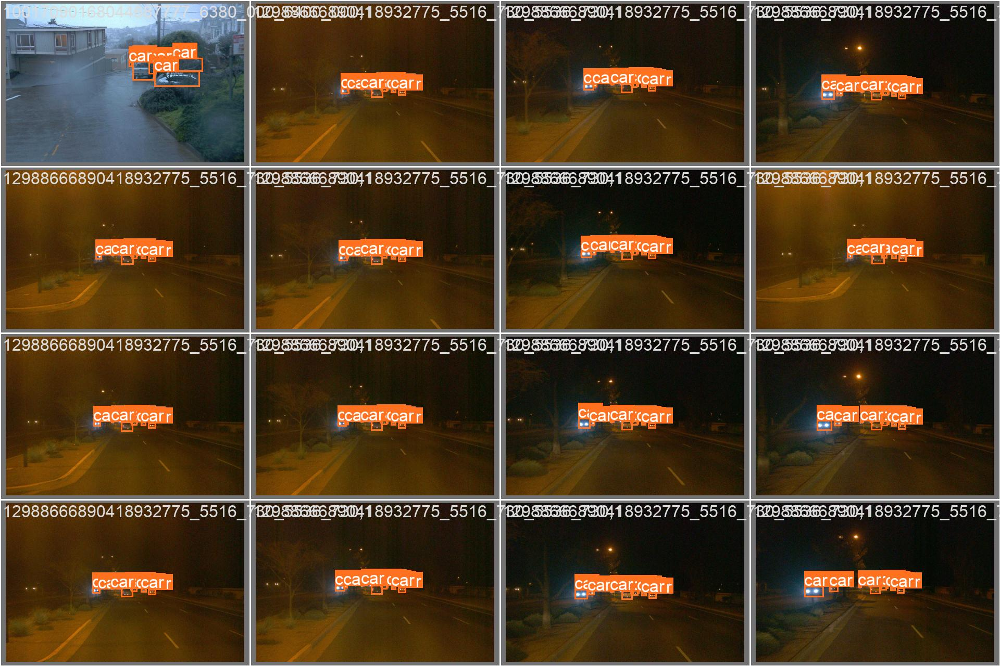

### **Predictions (Pretrained model):** 

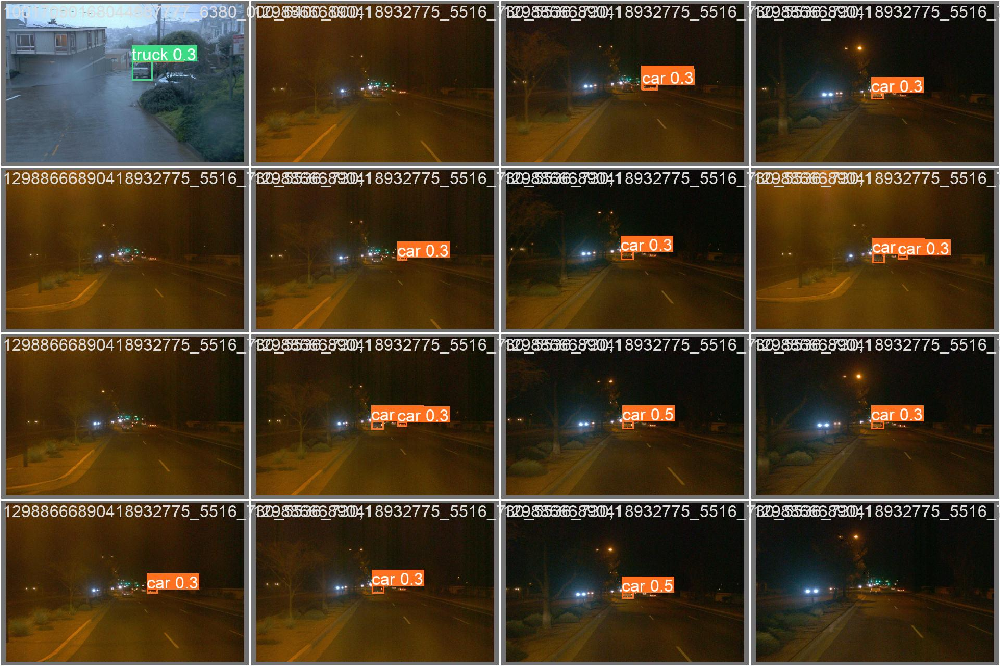

### **Comparison overlay (Pretrained model):**: We stack both the labels image and the prediction results image on top of one another. The result is an overlay that compares both images based on bounding boxes opacity.

![runs/test1/overlay.jpg](runs/test1/overlay.jpg) 


From the provided labels and predictions as well as the comparison overlay we see that the pretrained model is able to indentify some cars **bounding boxes with high opacity** but not all cars **(bounding boxes with lower opacity)** as it seems it has missed detections of multiple cars. We also observe some misclassifications such as a "car" being predicted as a "truck".

From this analysis, we conclude that the pretrained model seems to perform well on detecting cars but struggles with bicycles, both in terms of precision and recall. The performance on detecting persons is better than bicycles but not as good as cars. This could mean the model has been exposed to more examples of cars than bicycles, or due to the inherent difficulty of detecting bicycles due to their size.

The misclassifications and multiple detections for the same object in the validation images suggest that the model could benefit from further fine-tuning.

In a real-world setting, we think that this model would likely perform well in scenarios with a clear view of cars, but its performance would need to be improved for reliable detection of bicycles and also persons, which are currently less accurately detected.

## Finetuning

We now use the Waymo Open Dataset to train our `yolov3-tiny`, aiming to improve its accuracy on the dataset.

Explanation of the training parameters:

We used the <a href="https://docs.ultralytics.com/modes/train/#train-settings">defaults defined by ultralytics</a> for the training except for the following:

- <code>epochs=100</code> trains for 100 epochs
- <code>batch=-1</code> automatically determines the best batch size for the GPU used (Only works with cuda!)
- <code>project=project=os.path.join(os.getcwd(), 'runs')</code> changes the default path where the ultralytics library saves all training runs to the working directory
- <code>plots=True</code> prints out sample training batches as well as some dataset statistics

In [12]:
if not BEST_MODEL_WEIGHTS: # skips training when best model weights got downloaded before
    results = model.train(data=os.path.join('waymo_dataset_processed', 'waymo.yaml'), epochs=100, batch=-1, device=DEVICE, project=os.path.join(os.getcwd(), 'runs'), plots=True)

In [13]:
if not BEST_MODEL_WEIGHTS:
    create_video('runs/train/weights/best.pt')
else:
    create_video(BEST_MODEL_WEIGHTS)

Video('video_best.mp4')

We can see that overall, the model no longer detects objects other than cars, bicycles and pedestrians. However, these three object types are recognized with a higher confidence. The pedestrians crossing the second crosswalk are now correctly detected too.

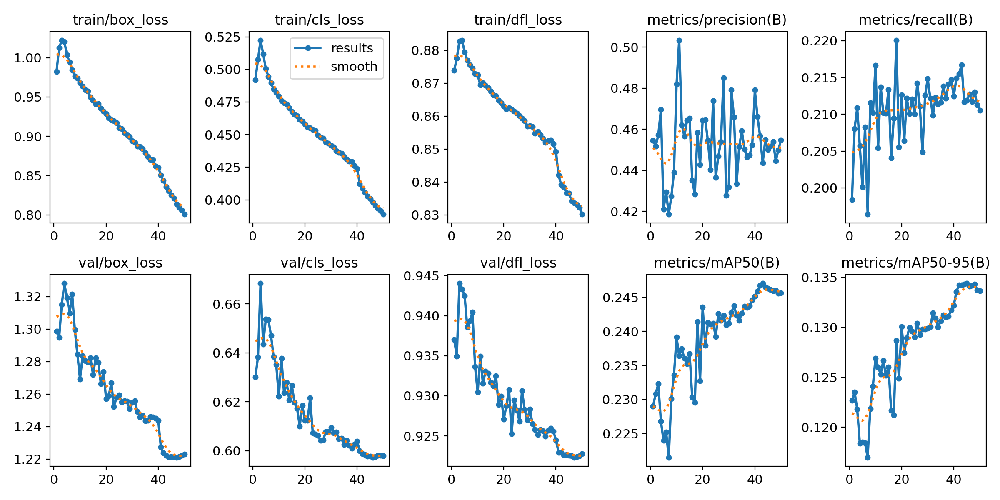

In [14]:
iPyImage('runs/train/results.png')

The training seems to have been successful, since the training as well as the validation losses consistently decreased rapidly. While the error for the detection of the bounding boxes, classification (`cls`) and objectness (`dfl`) went down, the mean average precision (`mAP50`) increased.

Let's also evaluate the finetuned model on the test set

In [ ]:
## Evaluation
if not BEST_MODEL_WEIGHTS:
    model = YOLO('runs/train/weights/best.pt')
else:
    model = YOLO(BEST_MODEL_WEIGHTS)

results = model.val(data='waymo_dataset_processed/waymo.yaml', batch=8, device=DEVICE, project=os.path.join(os.getcwd(), 'runs'), plots=True, split='test')

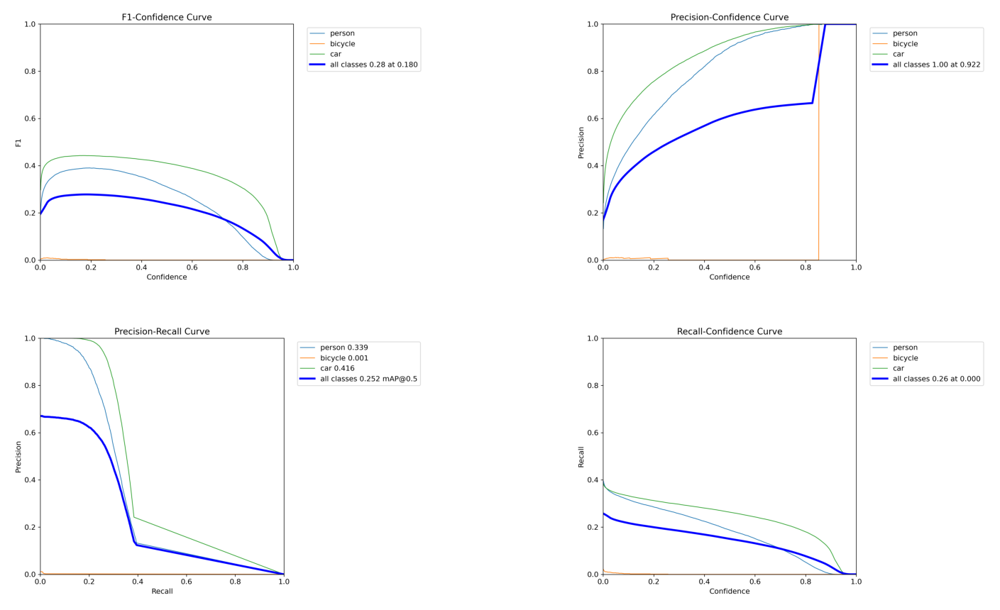

In [15]:
# Load the image files
img1 = plt.imread('runs/test2/F1_curve.png')
img2 = plt.imread('runs/test2/P_curve.png')
img3 = plt.imread('runs/test2/PR_curve.png')
img4 = plt.imread('runs/test2/R_curve.png')

# Create a figure and axes object
fig, axs = plt.subplots(2, 2, figsize=(16, 9))
fig.tight_layout()

# Display the images in the grid
axs[0, 0].imshow(img1)
axs[0, 1].imshow(img2)
axs[1, 0].imshow(img3)
axs[1, 1].imshow(img4)

# Disable image coordinates
axs[0, 0].axis('off')
axs[0, 1].axis('off')
axs[1, 0].axis('off')
axs[1, 1].axis('off')

# Show the plot
plt.show()


For the finetuned model, the F1 scores for 'person' and 'car' are higher compared to the pretrained model, which indicates that our finetuned model has improved balance of precision and recall. Also, the peak F1 score for all classes has increased, which means we achieved overall enhancement in model performance relative to the pretrained.

We see increase in precision for 'car' in the finetuned model at high confidence levels, and that means a reduction in false positives. The precision for 'person' at lower confidence thresholds is better in the finetuned model, suggesting more reliable detections.

The area under the curve for 'car' and 'person' is higher in the finetuned model, reflecting better overall performance. The 'bicycle' class remains problematic in both models, but we see a slight improvement our the finetuned model.

The finetuned model has a higher recall for 'car' across most confidence levels, indicating fewer missed detections and 'Person' recall is improved as well, especially at the mid-confidence range.

In [ ]:
img1 = plt.imread('runs/test2/val_batch0_labels.jpg')
img2 = plt.imread('runs/test2/val_batch0_pred.jpg')

# Create a figure and axes object
fig, axs = plt.subplots(1, 2, figsize=(21, 16))
fig.tight_layout()

# Display the images in the grid
axs[0].imshow(img1)
axs[1].imshow(img2)

axs[0].set_title("Labels")
axs[0].set_title("Predictions")

# Disable image coordinates
axs[0].axis('off')
axs[1].axis('off')

# Show the plot
plt.show()

## **labels**:

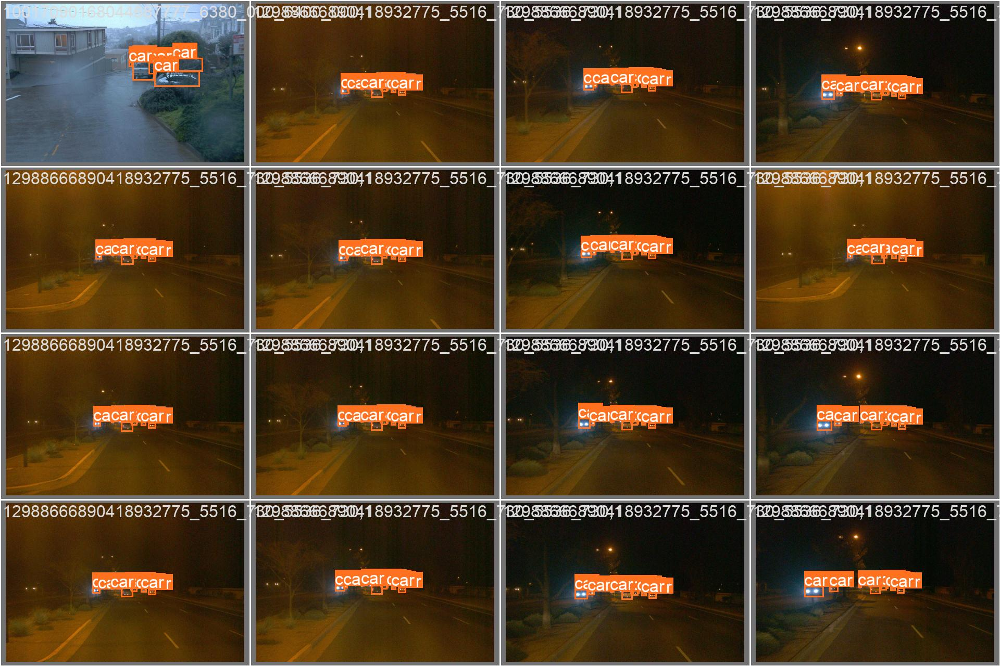

## **Predictions (Finetuned model)**:

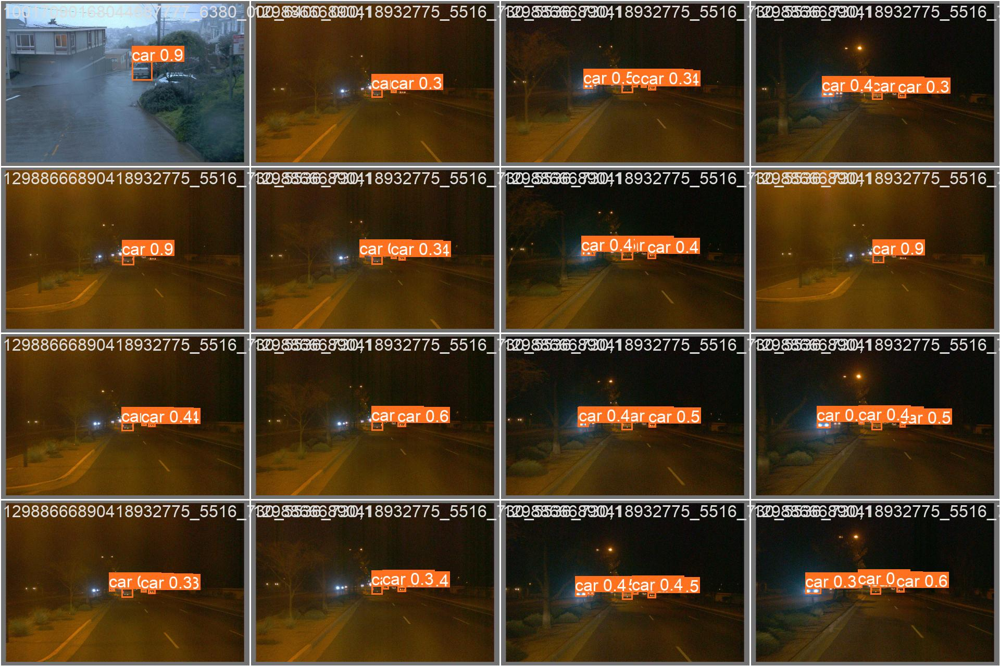

## **Comparison overlay (Finetuned model):** 

Predictions stacked on top of labels for visual comparison

![runs/test2/overlay.jpg](runs/test2/overlay.jpg)

From the results we observe that there are fewer instances of missed cars compared to the pretrained model results **(more instances of high opacity boudning boxes)**.
The finetuned model's confidence scores are also higher on average than the pretrained model's scores which indicates more instances of correctly identified cars.
Overall, the finetuned model seems to have a better performance in terms of detection and confidence, indicating the fine-tuning process has positively impacted the model's ability to recognize and correctly classify the the objects in these images.

## **Additional images for comparison**:
batch_0

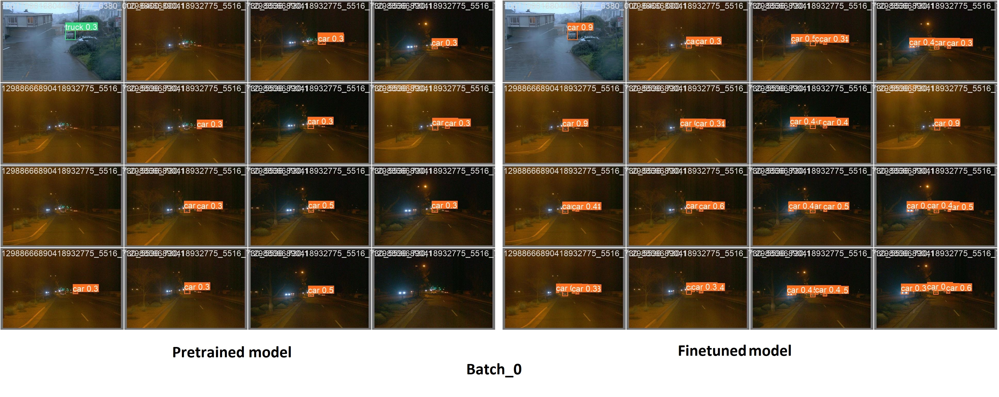

batch_1

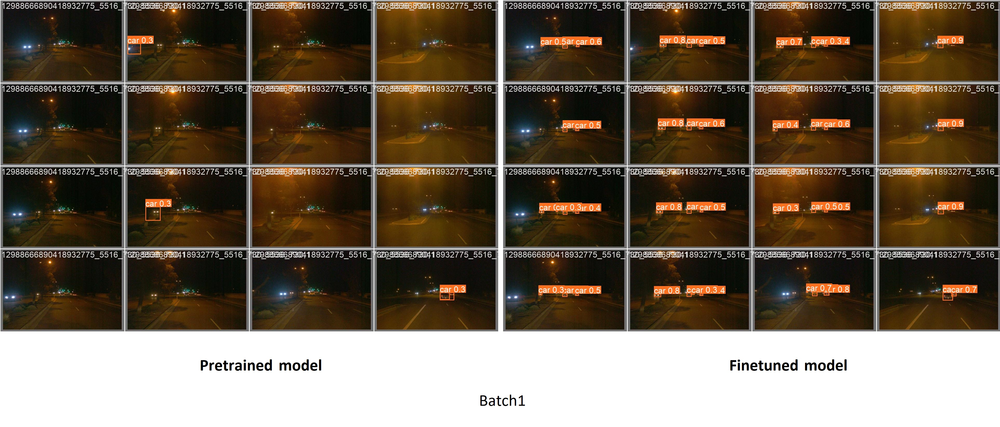

batch_2

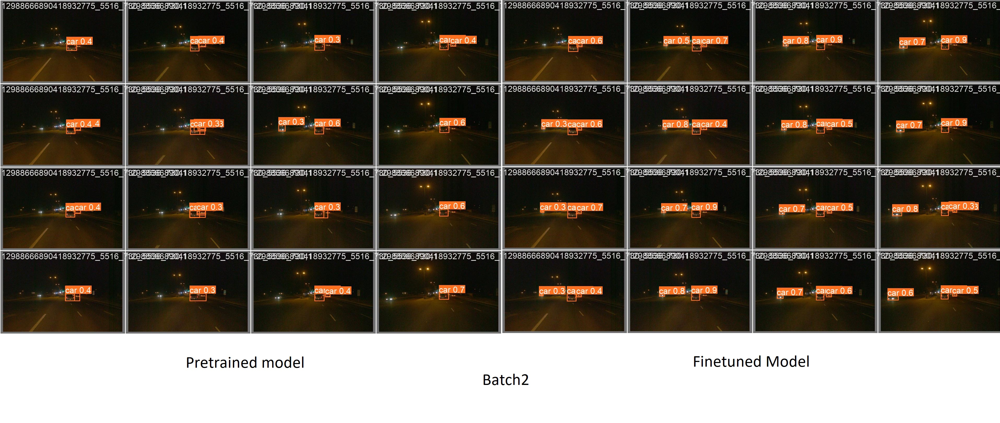

Overlay Comparison

![runs/test1/overlay_comparison.jpg](runs/test1/overlay_comparison.jpg)

The validation images show a noticeable improvement in the correct identification of 'car', especially for cars further away from the camera.

## **Conclusion**

In summary, the finetuned model shows substantial improvements over the pretrained model in several aspects:
- Better discrimination between objects and background, as fewer objects are misclassified as background.
- Improved detection of 'car' and 'person' with higher precision and recall.
- Reduced false positives for 'car' detections.
- Despite these improvements, 'bicycle' detection remains poor because of the imbalanced dataset

These results suggest that through finetuning we have adapted the model to the specifics of the dataset, particularly in detecting 'car' and 'person' with greater accuracy. The finetuned model is likely to be more reliable in for this dataset than the pretrained version.